In [1]:
import math
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib import style
import matplotlib as mpl
import paste
import scipy
import anndata
import os
import umap
from sklearn.decomposition import PCA
import scanpy as sc
import warnings
import json
from PIL import Image
import torch
import seaborn
from torch import nn
import torch.nn.functional as F
import cv2
from tqdm import tqdm
from matplotlib.colors import rgb2hex
import random
from scipy import stats
from scipy.stats import wilcoxon
from sklearn.metrics import mean_squared_error
from scipy.stats import ranksums
from scipy.spatial import distance_matrix
from scipy.spatial import distance

2024-08-20 15:04:39.722743: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /cm/shared/apps/slurm/current/lib64/slurm:/cm/shared/apps/slurm/current/lib64
2024-08-20 15:04:41.545714: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer.so.7'; dlerror: libnvinfer.so.7: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /cm/shared/apps/slurm/current/lib64/slurm:/cm/shared/apps/slurm/current/lib64
2024-08-20 15:04:41.545817: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer_plugin.so.7'; dlerror: libnvinfer_plugin.so.7: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /cm/shared/apps/slurm/current/lib64/slurm:/cm/shared/ap

In [2]:
import pycpd
from builtins import super
import numbers

In [3]:
class EMRegistration(object):
    """
    Expectation maximization point cloud registration.

    Attributes
    ----------
    X: numpy array
        NxD array of target points.

    Y: numpy array
        MxD array of source points.

    TY: numpy array
        MxD array of transformed source points.

    sigma2: float (positive)
        Initial variance of the Gaussian mixture model.

    N: int
        Number of target points.

    M: int
        Number of source points.

    D: int
        Dimensionality of source and target points

    iteration: int
        The current iteration throughout registration.

    max_iterations: int
        Registration will terminate once the algorithm has taken this
        many iterations.

    tolerance: float (positive)
        Registration will terminate once the difference between
        consecutive objective function values falls within this tolerance.

    w: float (between 0 and 1)
        Contribution of the uniform distribution to account for outliers.
        Valid values span 0 (inclusive) and 1 (exclusive).

    q: float
        The objective function value that represents the misalignment between source
        and target point clouds.

    diff: float (positive)
        The absolute difference between the current and previous objective function values.

    P: numpy array
        MxN array of probabilities.
        P[m, n] represents the probability that the m-th source point
        corresponds to the n-th target point.

    Pt1: numpy array
        Nx1 column array.
        Multiplication result between the transpose of P and a column vector of all 1s.

    P1: numpy array
        Mx1 column array.
        Multiplication result between P and a column vector of all 1s.

    Np: float (positive)
        The sum of all elements in P.

    """

    def __init__(self, X, Y, sigma2=None, max_iterations=None, tolerance=None, w=None, *args, **kwargs):
        if type(X) is not np.ndarray or X.ndim != 2:
            raise ValueError(
                "The target point cloud (X) must be at a 2D numpy array.")

        if type(Y) is not np.ndarray or Y.ndim != 2:
            raise ValueError(
                "The source point cloud (Y) must be a 2D numpy array.")

        if X.shape[1] != Y.shape[1]:
            raise ValueError(
                "Both point clouds need to have the same number of dimensions.")

        if sigma2 is not None and (not isinstance(sigma2, numbers.Number) or sigma2 <= 0):
            raise ValueError(
                "Expected a positive value for sigma2 instead got: {}".format(sigma2))

        if max_iterations is not None and (not isinstance(max_iterations, numbers.Number) or max_iterations < 0):
            raise ValueError(
                "Expected a positive integer for max_iterations instead got: {}".format(max_iterations))
        elif isinstance(max_iterations, numbers.Number) and not isinstance(max_iterations, int):
            warn("Received a non-integer value for max_iterations: {}. Casting to integer.".format(max_iterations))
            max_iterations = int(max_iterations)

        if tolerance is not None and (not isinstance(tolerance, numbers.Number) or tolerance < 0):
            raise ValueError(
                "Expected a positive float for tolerance instead got: {}".format(tolerance))

        if w is not None and (not isinstance(w, numbers.Number) or w < 0 or w >= 1):
            raise ValueError(
                "Expected a value between 0 (inclusive) and 1 (exclusive) for w instead got: {}".format(w))

        self.X = X
        self.Y = Y
        self.TY = Y
        self.sigma2 = initialize_sigma2(X, Y) if sigma2 is None else sigma2
        (self.N, self.D) = self.X.shape
        (self.M, _) = self.Y.shape
        self.tolerance = 0.001 if tolerance is None else tolerance
        self.w = 0.0 if w is None else w
        self.max_iterations = 100 if max_iterations is None else max_iterations
        self.iteration = 0
        self.diff = np.inf
        self.q = np.inf
        self.P = np.zeros((self.M, self.N))
        self.Pt1 = np.zeros((self.N, ))
        self.P1 = np.zeros((self.M, ))
        self.PX = np.zeros((self.M, self.D))
        self.Np = 0

    def register(self, callback=lambda **kwargs: None):
        """
        Perform the EM registration.

        Attributes
        ----------
        callback: function
            A function that will be called after each iteration.
            Can be used to visualize the registration process.
        
        Returns
        -------
        self.TY: numpy array
            MxD array of transformed source points.
        
        registration_parameters:
            Returned params dependent on registration method used. 
        """
        self.transform_point_cloud()
        while self.iteration < self.max_iterations and self.diff > self.tolerance:
            self.iterate()
            if callable(callback):
                kwargs = {'iteration': self.iteration,
                          'error': self.q, 'X': self.X, 'Y': self.TY}
                callback(**kwargs)

        return self.TY, self.get_registration_parameters()

    def get_registration_parameters(self):
        """
        Placeholder for child classes.
        """
        raise NotImplementedError(
            "Registration parameters should be defined in child classes.")

    def update_transform(self):
        """
        Placeholder for child classes.
        """
        raise NotImplementedError(
            "Updating transform parameters should be defined in child classes.")

    def transform_point_cloud(self):
        """
        Placeholder for child classes.
        """
        raise NotImplementedError(
            "Updating the source point cloud should be defined in child classes.")

    def update_variance(self):
        """
        Placeholder for child classes.
        """
        raise NotImplementedError(
            "Updating the Gaussian variance for the mixture model should be defined in child classes.")

    def iterate(self):
        """
        Perform one iteration of the EM algorithm.
        """
        self.expectation()
        self.maximization()
        self.iteration += 1

    def expectation(self):
        """
        Compute the expectation step of the EM algorithm.
        """
        P = np.sum((self.X[None, :, :] - self.TY[:, None, :])**2, axis=2) # (M, N)
        P = np.exp(-P/(2*self.sigma2))
        c = (2*np.pi*self.sigma2)**(self.D/2)*self.w/(1. - self.w)*self.M/self.N

        den = np.sum(P, axis = 0, keepdims = True) # (1, N)
        den = np.clip(den, np.finfo(self.X.dtype).eps, None) + c

        self.P = np.divide(P, den)
        self.Pt1 = np.sum(self.P, axis=0)
        self.P1 = np.sum(self.P, axis=1)
        self.Np = np.sum(self.P1)
        self.PX = np.matmul(self.P, self.X)

    def maximization(self):
        """
        Compute the maximization step of the EM algorithm.
        """
        self.update_transform()
        self.transform_point_cloud()
        self.update_variance()

In [4]:
def initialize_sigma2(X, Y):
    """
    Initialize the variance (sigma2).

    Attributes
    ----------
    X: numpy array
        NxD array of points for target.
    
    Y: numpy array
        MxD array of points for source.
    
    Returns
    -------
    sigma2: float
        Initial variance.
    """
    (N, D) = X.shape
    (M, _) = Y.shape
    diff = X[None, :, :] - Y[:, None, :]
    err = diff ** 2
    return np.sum(err) / (D * M * N)
    
def gaussian_kernel(X, beta, Y=None):
    if Y is None:
        Y = X
    diff = X[:, None, :] - Y[None, :,  :]
    diff = np.square(diff)
    diff = np.sum(diff, 2)
    return np.exp(-diff / (2 * beta**2))

def low_rank_eigen(G, num_eig):
    """
    Calculate num_eig eigenvectors and eigenvalues of gaussian matrix G.
    Enables lower dimensional solving.
    """
    S, Q = np.linalg.eigh(G)
    eig_indices = list(np.argsort(np.abs(S))[::-1][:num_eig])
    Q = Q[:, eig_indices]  # eigenvectors
    S = S[eig_indices]  # eigenvalues.
    return Q, S

In [5]:
class DeformableRegistration(EMRegistration):
    """
    Deformable registration.

    Attributes
    ----------
    alpha: float (positive)
        Represents the trade-off between the goodness of maximum likelihood fit and regularization.

    beta: float(positive)
        Width of the Gaussian kernel.
    
    low_rank: bool
        Whether to use low rank approximation.
    
    num_eig: int
        Number of eigenvectors to use in lowrank calculation.
    """

    def __init__(self, alpha=None, beta=None, low_rank=False, num_eig=100, *args, **kwargs):
        super().__init__(*args, **kwargs)
        if alpha is not None and (not isinstance(alpha, numbers.Number) or alpha <= 0):
            raise ValueError(
                "Expected a positive value for regularization parameter alpha. Instead got: {}".format(alpha))

        if beta is not None and (not isinstance(beta, numbers.Number) or beta <= 0):
            raise ValueError(
                "Expected a positive value for the width of the coherent Gaussian kerenl. Instead got: {}".format(beta))

        self.alpha = 2 if alpha is None else alpha
        self.beta = 2 if beta is None else beta
        self.W = np.zeros((self.M, self.D))
        self.G = gaussian_kernel(self.Y, self.beta)
        self.low_rank = low_rank
        self.num_eig = num_eig
        if self.low_rank is True:
            self.Q, self.S = low_rank_eigen(self.G, self.num_eig)
            self.inv_S = np.diag(1./self.S)
            self.S = np.diag(self.S)
            self.E = 0.

    def update_transform(self):
        """
        Calculate a new estimate of the deformable transformation.
        See Eq. 22 of https://arxiv.org/pdf/0905.2635.pdf.

        """
        if self.low_rank is False:
            A = np.dot(np.diag(self.P1), self.G) + \
                self.alpha * self.sigma2 * np.eye(self.M)
            B = self.PX - np.dot(np.diag(self.P1), self.Y)
            self.W = np.linalg.solve(A, B)

        elif self.low_rank is True:
            # Matlab code equivalent can be found here:
            # https://github.com/markeroon/matlab-computer-vision-routines/tree/master/third_party/CoherentPointDrift
            dP = np.diag(self.P1)
            dPQ = np.matmul(dP, self.Q)
            F = self.PX - np.matmul(dP, self.Y)

            self.W = 1 / (self.alpha * self.sigma2) * (F - np.matmul(dPQ, (
                np.linalg.solve((self.alpha * self.sigma2 * self.inv_S + np.matmul(self.Q.T, dPQ)),
                                (np.matmul(self.Q.T, F))))))
            QtW = np.matmul(self.Q.T, self.W)
            self.E = self.E + self.alpha / 2 * np.trace(np.matmul(QtW.T, np.matmul(self.S, QtW)))

    def transform_point_cloud(self, Y=None):
        """
        Update a point cloud using the new estimate of the deformable transformation.

        Attributes
        ----------
        Y: numpy array, optional
            Array of points to transform - use to predict on new set of points.
            Best for predicting on new points not used to run initial registration.
                If None, self.Y used.
        
        Returns
        -------
        If Y is None, returns None.
        Otherwise, returns the transformed Y.
                

        """
        self.W[:,2:]=0
        if Y is not None:
            G = gaussian_kernel(X=Y, beta=self.beta, Y=self.Y)
            return Y + np.dot(G, self.W)
        else:
            if self.low_rank is False:
                self.TY = self.Y + np.dot(self.G, self.W)

            elif self.low_rank is True:
                self.TY = self.Y + np.matmul(self.Q, np.matmul(self.S, np.matmul(self.Q.T, self.W)))
                return


    def update_variance(self):
        """
        Update the variance of the mixture model using the new estimate of the deformable transformation.
        See the update rule for sigma2 in Eq. 23 of of https://arxiv.org/pdf/0905.2635.pdf.

        """
        qprev = self.sigma2

        # The original CPD paper does not explicitly calculate the objective functional.
        # This functional will include terms from both the negative log-likelihood and
        # the Gaussian kernel used for regularization.
        self.q = np.inf

        xPx = np.dot(np.transpose(self.Pt1), np.sum(
            np.multiply(self.X, self.X), axis=1))
        yPy = np.dot(np.transpose(self.P1),  np.sum(
            np.multiply(self.TY, self.TY), axis=1))
        trPXY = np.sum(np.multiply(self.TY, self.PX))

        self.sigma2 = (xPx - 2 * trPXY + yPy) / (self.Np * self.D)

        if self.sigma2 <= 0:
            self.sigma2 = self.tolerance / 10

        # Here we use the difference between the current and previous
        # estimate of the variance as a proxy to test for convergence.
        self.diff = np.abs(self.sigma2 - qprev)

    def get_registration_parameters(self):
        """
        Return the current estimate of the deformable transformation parameters.


        Returns
        -------
        self.G: numpy array
            Gaussian kernel matrix.

        self.W: numpy array
            Deformable transformation matrix.
        """
        return self.G, self.W

In [6]:
def apply_homography(coordinates, H):
    """
    Apply a 3x3 homography matrix to 2D coordinates.

    :param coordinates: A numpy array of shape (n, 2) containing 2D coordinates.
    :param H: A numpy array of shape (3, 3) representing the homography matrix.
    :return: A numpy array of shape (n, 2) with transformed coordinates.
    """
    # Convert (x, y) to homogeneous coordinates (x, y, 1)
    n = coordinates.shape[0]
    homogeneous_coords = np.hstack((coordinates, np.ones((n, 1))))

    # Apply the homography matrix
    transformed_homogeneous = np.dot(homogeneous_coords, H.T)

    # Convert back from homogeneous coordinates (x', y', w') to (x'/w', y'/w')
    transformed_coords = transformed_homogeneous[:, :2] / transformed_homogeneous[:, [2]]

    return transformed_coords

# Functions

In [7]:
def get_library_id(adata):
    assert 'spatial' in adata.uns, "spatial not present in adata.uns"
    library_ids = adata.uns['spatial'].keys()
    try:
        library_id = list(library_ids)[0]
        return library_id
    except IndexError:
        logger.error('No library_id found in adata')

def get_scalefactors(adata, library_id=None):
    if library_id is None:
        library_id = get_library_id(adata)
    try:
        scalef = adata.uns['spatial'][library_id]['scalefactors']
        return scalef
    except IndexError:
        logger.error('scalefactors not found in adata')

def get_spot_diameter_in_pixels(adata, library_id=None):
    scalef = get_scalefactors(adata, library_id=library_id) 
    try:
        spot_diameter = scalef['spot_diameter_fullres']
        return spot_diameter    
    except TypeError:
        pass
    except KeyError:
        logger.error('spot_diameter_fullres not found in adata')

In [8]:
def find_matching_indices(list1, list2):
    """
    Finds indices of matching elements between two lists of possibly different lengths and returns a 2D NumPy array.

    :param list1: The first list.
    :param list2: The second list.
    :return: A 2D NumPy array where each row contains the indices of matching elements (index_list1, index_list2).
    """
    # Determine which list is shorter
    if len(list1) <= len(list2):
        shorter, longer = list1, list2
        primary_index_is_list1 = True
    else:
        shorter, longer = list2, list1
        primary_index_is_list1 = False

    # Using a list to store matching index pairs
    matching_indices = []

    # Iterate over the shorter list to find matches in the longer list
    for idx_short, value in enumerate(shorter):
        try:
            idx_long = longer.index(value)  # Find the first occurrence in the longer list
            if primary_index_is_list1:
                matching_indices.append([idx_short, idx_long])
            else:
                matching_indices.append([idx_long, idx_short])
        except ValueError:
            continue  # Continue if the value is not found in the longer list

    # Convert the list of indices to a 2D NumPy array
    return np.array(matching_indices, dtype=int)

In [9]:
def find_homography_translation_rotation(src_points, dst_points):
    """
    Find the homography between two sets of coordinates with only translation and rotation.

    :param src_points: A numpy array of shape (n, 2) containing source coordinates.
    :param dst_points: A numpy array of shape (n, 2) containing destination coordinates.
    :return: A 3x3 homography matrix.
    """
    # Ensure the points are in the correct shape
    assert src_points.shape == dst_points.shape
    assert src_points.shape[1] == 2

    # Calculate the centroids of the point sets
    src_centroid = np.mean(src_points, axis=0)
    dst_centroid = np.mean(dst_points, axis=0)

    # Center the points around the centroids
    centered_src_points = src_points - src_centroid
    centered_dst_points = dst_points - dst_centroid

    # Calculate the covariance matrix
    H = np.dot(centered_src_points.T, centered_dst_points)

    # Singular Value Decomposition (SVD)
    U, S, Vt = np.linalg.svd(H)

    # Calculate the rotation matrix
    R = np.dot(Vt.T, U.T)

    # Ensure a proper rotation matrix (det(R) = 1)
    if np.linalg.det(R) < 0:
        Vt[-1, :] *= -1
        R = np.dot(Vt.T, U.T)

    # Calculate the translation vector
    t = dst_centroid - np.dot(R, src_centroid)

    # Construct the homography matrix
    homography_matrix = np.eye(3)
    homography_matrix[0:2, 0:2] = R
    homography_matrix[0:2, 2] = t

    return homography_matrix

In [10]:
def nearest_neighbour(coords1, coords2, max_distance=20):
    paired_indices = []
    for i, coord1 in enumerate(tqdm(coords1, desc="Processing coordinates")):
        min_dist = float('inf')
        min_index = -1
        for j, coord2 in enumerate(coords2):
            dist = distance.euclidean(coord1, coord2)
            if dist < min_dist:
                min_dist = dist
                min_index = j
        if min_dist <= max_distance:
            paired_indices.append([i, min_index])
    
    return np.array(paired_indices)

In [11]:
def get_neighbors(ad, spot_idx):
    return ad.obs.loc[((abs(ad.obs['array_row'] - ad.obs.loc[spot_idx]['array_row'])==1) & (abs(ad.obs['array_col'] - ad.obs.loc[spot_idx]['array_col'])==1)) | 
           ((abs(ad.obs['array_row'] - ad.obs.loc[spot_idx]['array_row'])==0) & (abs(ad.obs['array_col'] - ad.obs.loc[spot_idx]['array_col'])==2))].index.tolist() + [spot_idx]

In [12]:
def find_nearby_points(df, max_distance=25):
    """
    For each point in the dataframe, calculate the distance to all other points and return the indices of points
    where the distance is smaller than a given value.

    :param df: A pandas DataFrame with two columns 'newx' and 'newy' containing coordinates.
    :param max_distance: The maximum distance to consider points as "nearby".
    :return: A pandas DataFrame where each row corresponds to a point and contains a list of indices of nearby points.
    """
    coords = df[['newx', 'newy']].values
    dist_matrix = distance_matrix(coords, coords)
    
    nearby_points = []
    for i in range(dist_matrix.shape[0]):
        nearby_indices = np.where(dist_matrix[i] < max_distance)[0]
        nearby_points.append(nearby_indices.tolist()) 
    
    return pd.DataFrame({'nearby_points': nearby_points}, index=df.index)

In [13]:
def get_mean_expr_by_neighbor(ad):
    mean_expression_bulk_spot = {}
    for spot_idx in tqdm(ad.obs.index):
        assort_spot_idx = get_neighbors(ad, spot_idx)
        spot_expression_data = ad[assort_spot_idx].X
    
        if not isinstance(spot_expression_data, np.ndarray):
            spot_expression_data = spot_expression_data.toarray()
    
        mean_expression = np.mean(spot_expression_data, axis=0)
        mean_expression_bulk_spot[spot_idx] = mean_expression
    
    expr = pd.DataFrame.from_dict(mean_expression_bulk_spot, orient='index', columns=ad.var_names)
    return expr

In [14]:
def get_mean_expr_by_dist(ad):
    mean_expression_bulk_spot = {}
    nearby_points_df = find_nearby_points(ad.obs)
    for spot_idx in tqdm(ad.obs.index):
        # assort_spot_idx = get_neighbors(ad, spot_idx)
        assort_spot_idx = nearby_points_df.loc[spot_idx, 'nearby_points']
        spot_expression_data = ad[assort_spot_idx].X
    
        if not isinstance(spot_expression_data, np.ndarray):
            spot_expression_data = spot_expression_data.toarray()
    
        mean_expression = np.mean(spot_expression_data, axis=0)
        mean_expression_bulk_spot[spot_idx] = mean_expression
    expr = pd.DataFrame.from_dict(mean_expression_bulk_spot, orient='index', columns=ad.var_names)
    return expr

In [15]:
data_dir = '/condo/wanglab/shared/wxc/clip/data/human/ST_data/data12_Ovarian_Carcinosarcoma_4sample/'

In [16]:
case_dir = '/condo/wanglab/shared/wxc/clip/data/human/ST_data/simulation_data/case_study/data12_Ovarian_Carcinosarcoma_4sample/'

In [17]:
pca = PCA(n_components=3)

In [18]:
case_dir_omiclip = case_dir+'omiclip/'
if not os.path.exists(case_dir_omiclip):
    os.makedirs(case_dir_omiclip)

# Aligment

In [19]:
def prepare_data(sample_name):
    ad = sc.read_h5ad(os.path.join(data_dir, sample_name+'.h5ad'))
    scalef = get_scalefactors(ad)['tissue_hires_scalef']
    ad_coor = np.array(ad.obsm['spatial'])*scalef
    img = ad.uns['spatial'][get_library_id(ad)]['images']['hires']
    if img.max()<1.1:
        img = (img*255).astype('uint8')

    return ad, ad_coor, img

In [20]:
tar_sample_name = '10X_Visium_gracia2021genome_HGSC_V19T26-103_C1_data'
src_sample_name = '10X_Visium_gracia2021genome_HGSC_V19T26-103_D1_data'

In [21]:
ad_tar, ad_tar_coor, tar_img =  prepare_data(tar_sample_name)
ad_src, ad_src_coor, src_img =  prepare_data(src_sample_name)

#### Manually Align

In [86]:
case_name = '_coca_after_training20'
tar_sample_name = '10X_Visium_gracia2021genome_HGSC_V19T26-103_C1_data'

In [87]:
ad_tar = sc.read_h5ad(os.path.join(data_dir, tar_sample_name+'.h5ad'))
library_id = get_library_id(ad_tar)
scalef = ad_tar.uns['spatial'][library_id]['scalefactors']['tissue_hires_scalef']

In [88]:
scalef

0.04111842

In [89]:
tar_img = ad_tar.uns['spatial'][library_id]['images']['hires']
if tar_img.max()<1.1:
    tar_img = (tar_img*255).astype('uint8')
ad_tar_coor = np.array(ad_tar.obs[['pixel_y','pixel_x']])*scalef

In [90]:
ad_tar_coor.shape

(3711, 2)

In [91]:
trg_features_path=os.path.join(data_dir, tar_sample_name+'_coca_txt_features'+case_name+'.csv')
trg_features = pd.read_csv(trg_features_path, index_col=0)

In [92]:
src_sample_name = '10X_Visium_gracia2021genome_HGSC_V19T26-103_D1_data'
ad_src = sc.read_h5ad(os.path.join(data_dir, src_sample_name+'.h5ad'))

In [93]:
ad_src

AnnData object with n_obs × n_vars = 3668 × 33538
    obs: 'in_tissue', 'array_row', 'array_col', 'leiden', 'pixel_y', 'pixel_x', 'cell_type'
    var: 'gene_ids', 'feature_types', 'genome', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'hvg', 'leiden', 'leiden_colors', 'log1p', 'moranI', 'neighbors', 'pca', 'spatial', 'spatial_neighbors', 'umap'
    obsm: 'X_pca', 'X_umap', 'spatial'
    varm: 'PCs'
    obsp: 'connectivities', 'distances', 'spatial_connectivities', 'spatial_distances'

In [94]:
ad_src_coor = np.array(ad_src.obs[['pixel_y','pixel_x']])*scalef
library_id = get_library_id(ad_src)
src_img = ad_src.uns['spatial'][library_id]['images']['hires']
if src_img.max()<1.1:
    src_img = (src_img*255).astype('uint8')

In [95]:
src_features_path=os.path.join(data_dir, src_sample_name+'_coca_txt_features'+case_name+'.csv')
src_features = pd.read_csv(src_features_path, index_col=0)

In [96]:
comb_features = pd.concat([src_features,trg_features],axis=1)
pca_image_fearures = pca.fit_transform(comb_features.T)

In [97]:
pca_rgb_image = (pca_image_fearures-pca_image_fearures.min(axis=0))/(pca_image_fearures.max(axis=0)-pca_image_fearures.min(axis=0))
pca_hex_image = [ rgb2hex(pca_rgb_image[i,:]) for i in range(pca_rgb_image.shape[0]) ]

In [157]:
ad_tar_coor_z = ad_tar_coor.copy()
ad_tar_coor_z[:,0] = (ad_tar_coor[:,0]-ad_tar_coor[:,0].min())/(ad_tar_coor[:,0].max()-ad_tar_coor[:,0].min())
ad_tar_coor_z[:,1] = (ad_tar_coor[:,1]-ad_tar_coor[:,1].min())/(ad_tar_coor[:,1].max()-ad_tar_coor[:,1].min())
ad_src_coor_z = ad_src_coor.copy()
ad_src_coor_z[:,0] = (ad_src_coor[:,0]-ad_src_coor[:,0].min())/(ad_src_coor[:,0].max()-ad_src_coor[:,0].min())
ad_src_coor_z[:,1] = (ad_src_coor[:,1]-ad_src_coor[:,1].min())/(ad_src_coor[:,1].max()-ad_src_coor[:,1].min())

pca_image_fearures_z = pca_image_fearures.copy()
pca_image_fearures_z[len(src_features.T):,0] = (pca_image_fearures_z[len(src_features.T):,0]-pca_image_fearures_z[len(src_features.T):,0].min())/(pca_image_fearures_z[len(src_features.T):,0].max()-pca_image_fearures_z[len(src_features.T):,0].min())
pca_image_fearures_z[len(src_features.T):,1] = (pca_image_fearures_z[len(src_features.T):,1]-pca_image_fearures_z[len(src_features.T):,1].min())/(pca_image_fearures_z[len(src_features.T):,1].max()-pca_image_fearures_z[len(src_features.T):,1].min())
pca_image_fearures_z[:len(src_features.T),0] = (pca_image_fearures_z[:len(src_features.T),0]-pca_image_fearures_z[:len(src_features.T),0].min())/(pca_image_fearures_z[:len(src_features.T),0].max()-pca_image_fearures_z[:len(src_features.T),0].min())
pca_image_fearures_z[:len(src_features.T),1] = (pca_image_fearures_z[:len(src_features.T),1]-pca_image_fearures_z[:len(src_features.T),1].min())/(pca_image_fearures_z[:len(src_features.T),1].max()-pca_image_fearures_z[:len(src_features.T),1].min())

In [158]:
ad_tar_coor_z = (ad_tar_coor-ad_tar_coor.min())/(ad_tar_coor.max()-ad_tar_coor.min())
ad_src_coor_z = (ad_src_coor-ad_src_coor.min())/(ad_src_coor.max()-ad_src_coor.min())

In [159]:
pca_image_fearures_z = (pca_image_fearures-pca_image_fearures.min())/(pca_image_fearures.max()-pca_image_fearures.min())

In [160]:
target = np.concatenate((ad_tar_coor_z, pca_image_fearures_z[len(src_features.T):,:2]), axis=1)
source = np.concatenate((ad_src_coor_z, pca_image_fearures_z[:len(src_features.T),:2]), axis=1)

reg = DeformableRegistration(X=target, Y=source, low_rank=True,
                             alpha=800, max_iterations=int(1e9), tolerance=1e-9)
TY = reg.register()[0]
# TY=(TY-TY.min())/(TY.max()-TY.min())

In [161]:
points1 = TY[:,:2].copy()
points1 = TY[:,:2]*(ad_tar_coor.max()-ad_tar_coor.min())+ad_tar_coor.min()
# points1[:,0] = TY[:,0]*(ad_tar_coor[:,0].max()-ad_tar_coor[:,0].min())+ad_tar_coor[:,0].min()
# points1[:,1] = TY[:,1]*(ad_tar_coor[:,1].max()-ad_tar_coor[:,1].min())+ad_tar_coor[:,1].min()

In [226]:
def generate_homography_matrix(rotation_degree, translation, center=[0, 0]):
    """
    Generate a homography matrix given the rotation in degrees and translation.

    :param rotation_degree: The rotation angle in degrees.
    :param translation: A tuple (tx, ty) representing the translation along x and y axes.
    :param center: A tuple (cx, cy) representing the center of rotation.
    :return: A 3x3 homography matrix.
    """
    # Convert rotation angle from degrees to radians
    angle_rad = np.radians(rotation_degree)
    
    # Rotation matrix components
    cos_angle = np.cos(angle_rad)
    sin_angle = np.sin(angle_rad)
    
    # Translation components
    tx, ty = translation
    cx, cy = center
    
    # Define the rotation matrix
    rotation_matrix = np.array([
        [cos_angle, -sin_angle, 0],
        [sin_angle,  cos_angle, 0],
        [0,          0,         1]
    ])
    
    # Translation matrices
    translate_to_origin = np.array([
        [1, 0, -cx],
        [0, 1, -cy],
        [0, 0,  1]
    ])
    
    translate_back_to_center = np.array([
        [1, 0, cx + tx],
        [0, 1, cy + ty],
        [0, 0, 1]
    ])
    
    # Homography matrix: H = T_back * R * T_origin
    homography_matrix = np.dot(np.dot(translate_back_to_center, rotation_matrix), translate_to_origin)
    
    return homography_matrix

In [333]:
# Example usage
rotation_degree = -9.1
translation = (-340, 200)
center = (0, 0)

h = generate_homography_matrix(rotation_degree, translation, center)
# print("Homography Matrix:\n", h)

Homography Matrix:
 [[ 9.87413807e-01  1.58158067e-01 -3.40000000e+02]
 [-1.58158067e-01  9.87413807e-01  2.00000000e+02]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


In [334]:
pst = apply_homography(ad_src_coor, h)
aligned_image = cv2.warpPerspective(src_img, h, (src_img.shape[1], src_img.shape[0]))

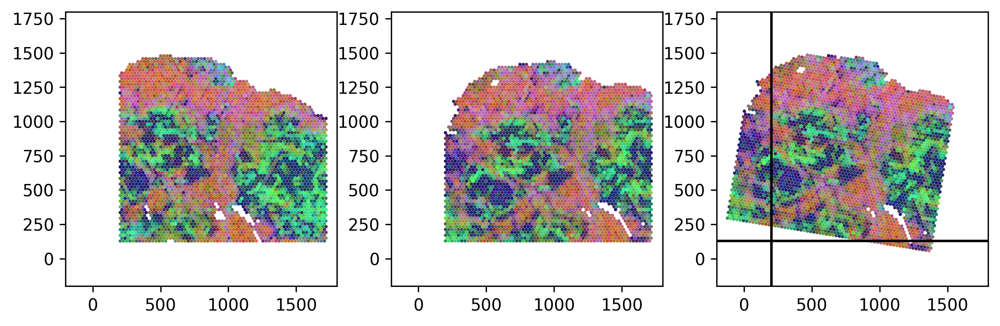

In [335]:
plt.figure(figsize=(10, 3), dpi=300)
plt.subplot(1, 3, 1)
plt.scatter(ad_tar_coor[:,0], ad_tar_coor[:,1], marker='o', alpha=1, s=1, c=pca_hex_image[len(src_features.T):])
plt.xlim([-200,1800])
plt.ylim([-200,1800])

plt.subplot(1, 3, 2)
plt.scatter(ad_src_coor[:,0], ad_src_coor[:,1], marker='o', alpha=1, s=1,c=pca_hex_image[:len(src_features.T)])
plt.xlim([-200,1800])
plt.ylim([-200,1800])

plt.subplot(1, 3, 3)
# plt.scatter(ad_tar_coor[:,0], ad_tar_coor[:,1], marker='o', alpha=0.2, s=1, c=pca_hex_image[len(src_features.T):])
plt.scatter(pst[:,0], pst[:,1], marker='o', s=1, c=pca_hex_image[:len(src_features.T)])
plt.xlim([-200,1800])
plt.ylim([-200,1800])
plt.axvline(x = ad_tar_coor[:,0].min(), color = 'black')
plt.axhline(y = ad_tar_coor[:,1].min(), color = 'black')

In [336]:
ad_src_manu_align = ad_src.copy()

In [337]:
ad_src_coor = np.array(ad_src.obs[['pixel_y','pixel_x']])*scalef
library_id = get_library_id(ad_src)

In [338]:
ad_src_manu_align.obs[['pixel_y','pixel_x']] = pst/scalef

In [339]:
ad_src_manu_align.uns['spatial'][library_id]['images']['hires'] = aligned_image

In [340]:
ad_src_manu_align.obsm['spatial'] = pst/scalef

In [341]:
ad_src_manu_align

AnnData object with n_obs × n_vars = 3668 × 33538
    obs: 'in_tissue', 'array_row', 'array_col', 'leiden', 'pixel_y', 'pixel_x', 'cell_type'
    var: 'gene_ids', 'feature_types', 'genome', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'hvg', 'leiden', 'leiden_colors', 'log1p', 'moranI', 'neighbors', 'pca', 'spatial', 'spatial_neighbors', 'umap'
    obsm: 'X_pca', 'X_umap', 'spatial'
    varm: 'PCs'
    obsp: 'connectivities', 'distances', 'spatial_connectivities', 'spatial_distances'

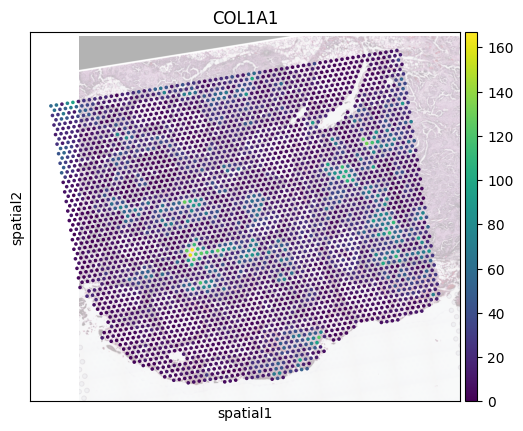

In [342]:
sc.pl.spatial(ad_src_manu_align, color='COL1A1',alpha_img=0.3)

In [343]:
ad_src_manu_align.write_h5ad('/condo/wanglab/shared/wxc/clip/data/human/ST_data/simulation_data/case_study/omiclip/ad_src_manu_align.h5ad')

In [344]:
# omiclip_matches = nearest_neighbour(ad_tar_sub.obsm['spatial']*scalef, ad_src_align_sub.obsm['spatial']*scalef)
manu_matches = nearest_neighbour(ad_src_manu_align.obsm['spatial']*scalef, ad_tar.obsm['spatial']*scalef)

Processing coordinates: 100%|██████████| 3668/3668 [00:52<00:00, 69.75it/s]


In [345]:
manu_matches.shape

(3161, 2)

In [346]:
manu_psr_st = pd.DataFrame()
for gene in tqdm(shared_genes_he):
    psr = stats.pearsonr(ad_tar_mean_expr.loc[manu_matches[:,1], gene],ad_src_align_mean_expr.loc[manu_matches[:,0], gene])[0]
    manu_psr_st.loc[gene, 'psr'] = psr

100%|██████████| 112/112 [00:00<00:00, 593.20it/s]


In [347]:
manu_psr_st

,psr
COL1A1,0.803432
MT-CYB,0.581521
COL1A2,0.728000
COL3A1,0.687316
CD74,0.724016
...,...
SOCS3,0.304900
YBX3,-0.037819
IER2,0.347677
PRDX3,0.014280


In [348]:
manu_psr_st.mean()

psr    0.473447
dtype: float64

## ST to ST D1 to C1

In [22]:
def get_features(sample_name, feature_type, case_name):
    features_path=os.path.join(case_dir_omiclip, sample_name+feature_type+case_name+'.csv')
    features = pd.read_csv(features_path, index_col=0, header = None)

    return features

In [23]:
def get_pca_by_fit(tar_features, src_features):
    pca_fit_tar = pca.fit(tar_features.T)
    pca_tar = pca_fit_tar.transform(tar_features.T)
    pca_src = pca_fit_tar.transform(src_features.T)
    pca_comb_features = np.concatenate((pca_tar, pca_src))
    pca_comb_features_batch = np.array([0]*len(pca_tar) + [1]*len(pca_src))

    return pca_comb_features, pca_comb_features_batch

In [24]:
def cpd_align(ad_tar_coor, ad_src_coor, pca_comb_features, src_img, alpha=0.5):
    ad_tar_coor_z = (ad_tar_coor-ad_tar_coor.min())/(ad_tar_coor.max()-ad_tar_coor.min())
    ad_src_coor_z = (ad_src_coor-ad_src_coor.min())/(ad_src_coor.max()-ad_src_coor.min())
    pca_comb_features_z = (pca_comb_features-pca_comb_features.min())/(pca_comb_features.max()-pca_comb_features.min())
    
    target = np.concatenate((ad_tar_coor_z, pca_comb_features_z[:len(tar_features.T),:2]), axis=1)
    source = np.concatenate((ad_src_coor_z, pca_comb_features_z[len(tar_features.T):,:2]), axis=1)
    
    reg = DeformableRegistration(X=target, Y=source, low_rank=True,
                                 alpha=alpha, 
                                 max_iterations=int(1e9), tolerance=1e-9)
    TY = reg.register()[0]
    
    cpd_coor = TY[:,:2]*(ad_tar_coor.max()-ad_tar_coor.min())+ad_tar_coor.min()
    
    h = find_homography_translation_rotation(ad_src_coor, cpd_coor)
    homo_coor = apply_homography(ad_src_coor, h)
    aligned_image = cv2.warpPerspective(src_img, h, (src_img.shape[1], src_img.shape[0]))

    return cpd_coor, homo_coor, aligned_image

In [25]:
def plot_alignment(ad_tar_coor, ad_src_coor, homo_coor, pca_hex_comb, tar_features, shift=300, s=0.8, boundary_line=True):

    plt.figure(figsize=(10, 3), dpi=300)
    plt.subplot(1, 3, 1)
    plt.scatter(ad_tar_coor[:,0], ad_tar_coor[:,1], marker='o', s=s, c=pca_hex_comb[:len(tar_features.T)])
    plt.xlim([ad_tar_coor.min()-shift,ad_tar_coor.max()+shift])
    plt.ylim([ad_tar_coor.min()-shift,ad_tar_coor.max()+shift])
    
    plt.subplot(1, 3, 2)
    plt.scatter(ad_src_coor[:,0], ad_src_coor[:,1], marker='o', s=s, c=pca_hex_comb[len(tar_features.T):])
    plt.xlim([ad_tar_coor.min()-shift,ad_tar_coor.max()+shift])
    plt.ylim([ad_tar_coor.min()-shift,ad_tar_coor.max()+shift])
    
    plt.subplot(1, 3, 3)
    plt.scatter(homo_coor[:,0], homo_coor[:,1], marker='o', s=s, c=pca_hex_comb[len(tar_features.T):])
    plt.xlim([ad_tar_coor.min()-shift,ad_tar_coor.max()+shift])
    plt.ylim([ad_tar_coor.min()-shift,ad_tar_coor.max()+shift])

    if boundary_line:
        plt.axvline(x = ad_tar_coor[:,0].min(), color = 'black')
        plt.axhline(y = ad_tar_coor[:,1].min(), color = 'black')

    plt.show()

In [26]:
def plot_alignment_with_img(ad_tar_coor, ad_src_coor, homo_coor, tar_img, src_img, aligned_image, pca_hex_comb, tar_features):
    plt.figure(figsize=(10, 8), dpi=150)
    plt.subplot(1, 3, 1)
    plt.scatter(ad_tar_coor[:,0], ad_tar_coor[:,1], marker='o', alpha=0.8, s=1, c=pca_hex_comb[:len(tar_features.T)])
    plt.imshow(tar_img, origin='lower', alpha=0.3)
    
    plt.subplot(1, 3, 2)
    plt.scatter(ad_src_coor[:,0], ad_src_coor[:,1], marker='o', alpha=0.8, s=1,c=pca_hex_comb[len(tar_features.T):])
    plt.imshow(src_img, origin='lower', alpha=0.3)
    
    plt.subplot(1, 3, 3)
    plt.scatter(ad_tar_coor[:,0], ad_tar_coor[:,1], marker='o', alpha=0.2, s=1, c=pca_hex_comb[:len(tar_features.T)])
    plt.scatter(homo_coor[:,0], homo_coor[:,1], marker='+', s=1, c=pca_hex_comb[len(tar_features.T):])
    plt.imshow(aligned_image, origin='lower', alpha=0.3)

    plt.show()

In [27]:
def wirte_aligned_data(ad_src, aligned_image, homo_coor,  save_name):
    ad_src_align = ad_src.copy()
    ad_src_align.obsm['spatial'] = homo_coor/ad_src.uns['spatial'][get_library_id(ad_src)]['scalefactors']['tissue_hires_scalef']
    ad_src_align.uns['spatial'][get_library_id(ad_src)]['images']['hires'] = aligned_image
    ad_src_align.write_h5ad(case_dir_omiclip+save_name)

In [28]:
case_name = '_coca_after_training20'

In [29]:
feature_type = '_coca_txt_features'
tar_features = get_features(tar_sample_name, feature_type, case_name)
src_features = get_features(src_sample_name, feature_type, case_name)

In [30]:
pca_comb_features, pca_comb_features_batch = get_pca_by_fit(tar_features, src_features)

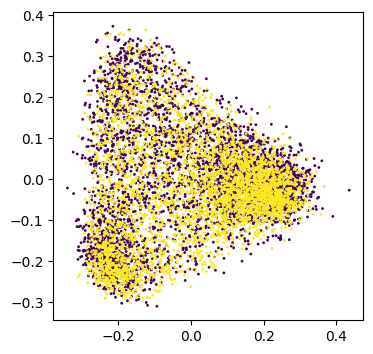

In [31]:
plt.figure(figsize=(4,4))
plt.scatter(pca_comb_features[:,0], pca_comb_features[:,1],c=pca_comb_features_batch, s=1)

In [32]:
pca_rgb_comb = (pca_comb_features-pca_comb_features.min(axis=0))/(pca_comb_features.max(axis=0)-pca_comb_features.min(axis=0))
pca_rgb_comb[:,0] = pca_rgb_comb[:,0].max()-pca_rgb_comb[:,0]
pca_rgb_comb[:,2] = pca_rgb_comb[:,2].max()-pca_rgb_comb[:,2]
pca_rgb_comb[:,1] = pca_rgb_comb[:,1]*0.8

In [33]:
pca_hex_comb = [ rgb2hex(pca_rgb_comb[i,:]) for i in range(pca_rgb_comb.shape[0]) ]

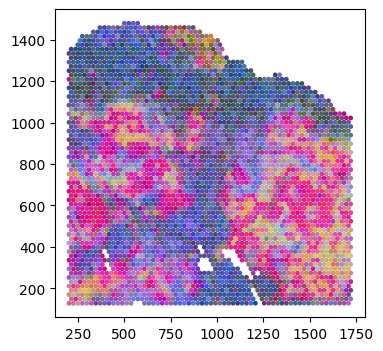

In [34]:
plt.figure(figsize=(4,4))
plt.scatter(ad_tar_coor[:,0], ad_tar_coor[:,1], marker='o', s=6, c=pca_hex_comb[:len(tar_features.T)])
plt.show()

In [35]:
alpha = 0.5
cpd_coor, homo_coor, aligned_image = cpd_align(ad_tar_coor, ad_src_coor, pca_comb_features, src_img, alpha)

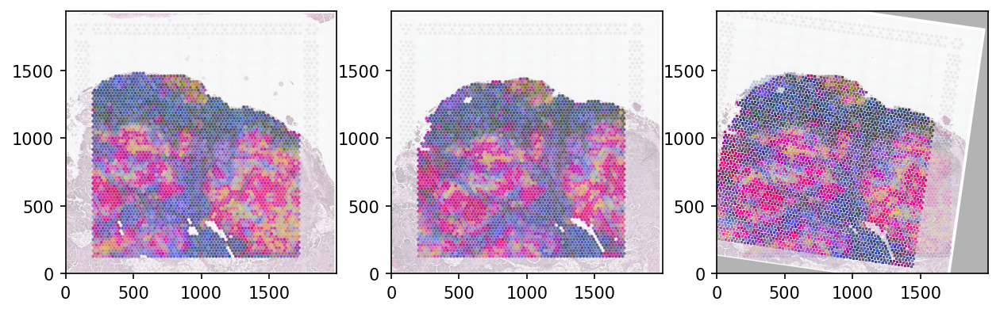

In [36]:
plot_alignment_with_img(ad_tar_coor, ad_src_coor, homo_coor, tar_img, src_img, aligned_image, pca_hex_comb, tar_features)

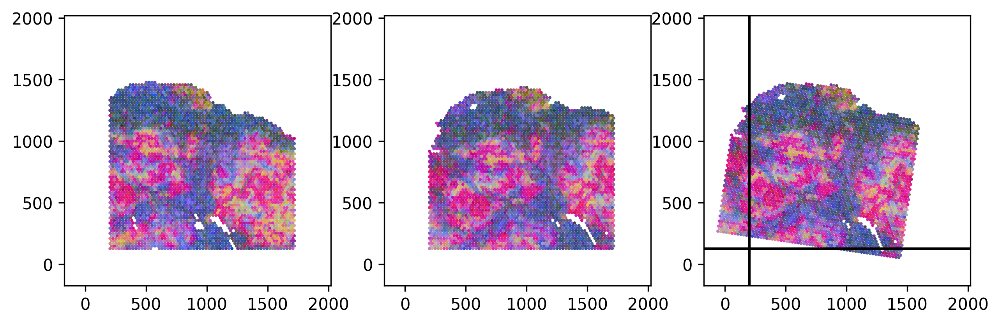

In [37]:
shift=300
s=0.8
plot_alignment(ad_tar_coor, ad_src_coor, homo_coor, pca_hex_comb, tar_features, shift=300, s=0.8)

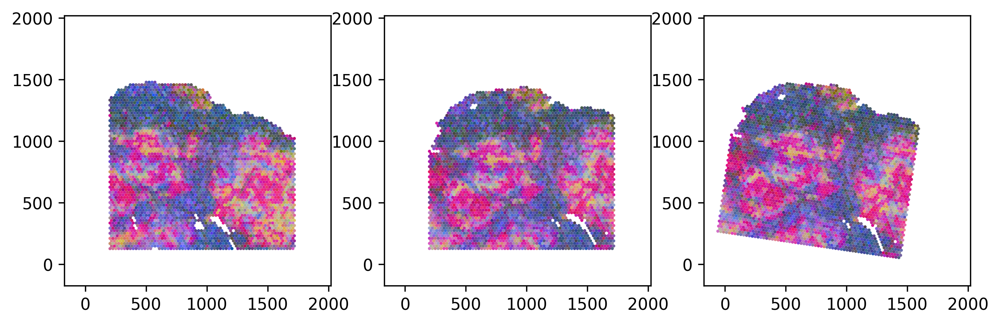

In [38]:
plot_alignment(ad_tar_coor, ad_src_coor, homo_coor, pca_hex_comb, tar_features, shift=300, s=0.8, boundary_line=False)

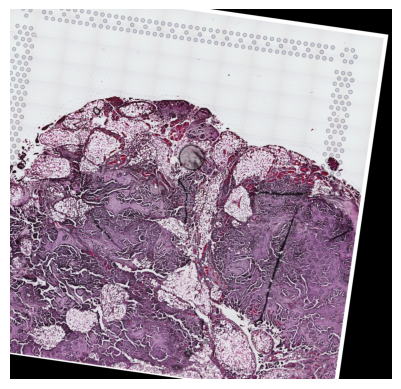

In [39]:
plt.imshow(aligned_image, origin='lower')
plt.axis('off')
plt.show()

In [40]:
save_name = 'omiclip_st_st_alpha0.5.h5ad'
wirte_aligned_data(ad_src, aligned_image, homo_coor,  save_name)

## Img to ST

### Align Image to ST Before Finetune

In [41]:
case_name = '_coca_after_training20'

In [42]:
tar_features = get_features(tar_sample_name, '_coca_txt_features', case_name)
src_features = get_features(src_sample_name, '_coca_img_features', case_name)

In [43]:
pca_comb_features, pca_comb_features_batch = get_pca_by_fit(tar_features, src_features)

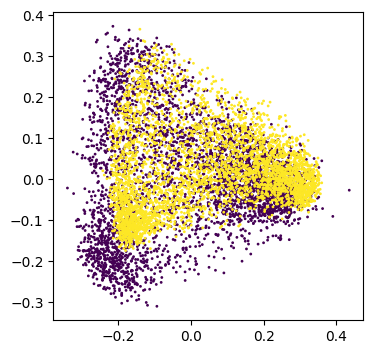

In [44]:
plt.figure(figsize=(4,4))
plt.scatter(pca_comb_features[:,0], pca_comb_features[:,1],c=pca_comb_features_batch, s=1)

In [45]:
alpha = 0.5
cpd_coor, homo_coor, aligned_image = cpd_align(ad_tar_coor, ad_src_coor, pca_comb_features, src_img, alpha)

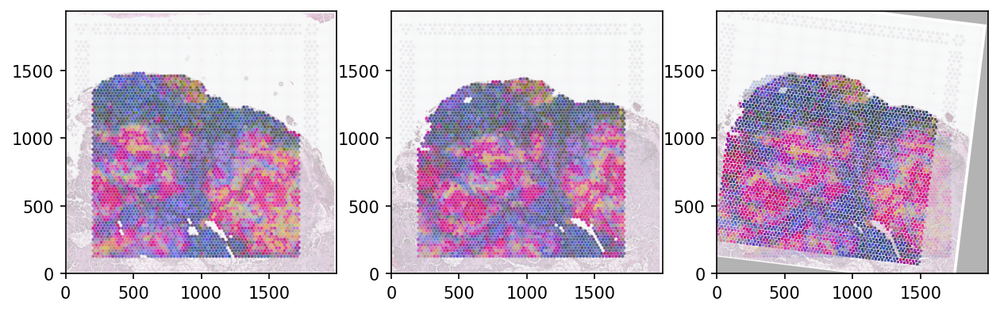

In [46]:
plot_alignment_with_img(ad_tar_coor, ad_src_coor, homo_coor, tar_img, src_img, aligned_image, pca_hex_comb, tar_features)

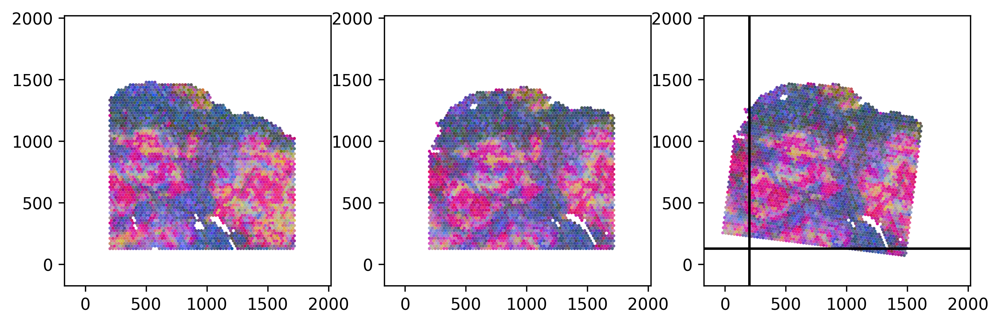

In [47]:
shift=300
s=0.8
plot_alignment(ad_tar_coor, ad_src_coor, homo_coor, pca_hex_comb, tar_features, shift=300, s=0.8)

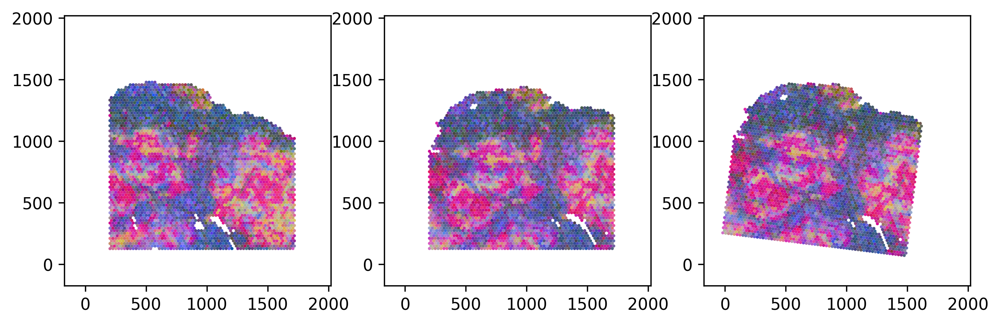

In [48]:
plot_alignment(ad_tar_coor, ad_src_coor, homo_coor, pca_hex_comb, tar_features, shift=300, s=0.8, boundary_line=False)

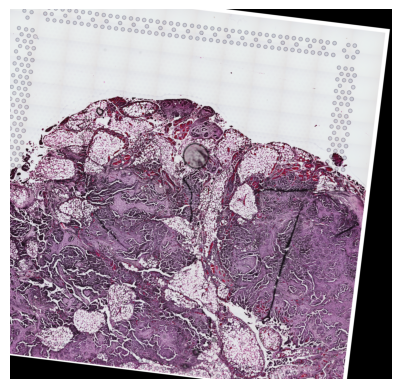

In [49]:
plt.imshow(aligned_image, origin='lower')
plt.axis('off')
plt.show()

In [50]:
save_name = 'omiclip_st_img_zeroshot_alpha0.5.h5ad'
wirte_aligned_data(ad_src, aligned_image, homo_coor,  save_name)

### Generate data for finetune

In [57]:
data_dir = '/condo/wanglab/shared/wxc/clip/data/human/ST_data/data12_Ovarian_Carcinosarcoma_4sample/'

In [58]:
dfpath = '/condo/wanglab/shared/wxc/clip/data/human/ST_data/all_top50_heg_remove_dots_dash_hk_genes_no_comma_train_2157867.csv'
DATAFRAME = pd.read_csv(dfpath, index_col=0)
target_df = DATAFRAME[DATAFRAME['sample_name'].isin([tar_sample_name])]
target_df['img_path'] = '/condo/wanglab/shared/wxc/clip/data/human/ST_data/images/patches/'+target_df['img_idx']+'.png'
target_df

/tmp/ipykernel_1616686/908046902.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  target_df['img_path'] = '/condo/wanglab/shared/wxc/clip/data/human/ST_data/images/patches/'+target_df['img_idx']+'.png'


,label,sample_name,dataset,img_idx,img_path
10X_Visium_gracia2021genome_HGSC_V19T26-103_C1_data_AAACAACGAATAGTTC-1,IGKC COL1A1 SPARC RPL10 APOE COL6A2 COL3A1 RPS...,10X_Visium_gracia2021genome_HGSC_V19T26-103_C1...,data12_Ovarian_Carcinosarcoma_4sample,10X_Visium_gracia2021genome_HGSC_V19T26-103_C1...,/condo/wanglab/shared/wxc/clip/data/human/ST_d...
10X_Visium_gracia2021genome_HGSC_V19T26-103_C1_data_AAACAAGTATCTCCCA-1,COL1A1 C1QA IGKC IGFBP7 CTSB IGFBP4 RPL5 COL3A...,10X_Visium_gracia2021genome_HGSC_V19T26-103_C1...,data12_Ovarian_Carcinosarcoma_4sample,10X_Visium_gracia2021genome_HGSC_V19T26-103_C1...,/condo/wanglab/shared/wxc/clip/data/human/ST_d...
10X_Visium_gracia2021genome_HGSC_V19T26-103_C1_data_AAACAATCTACTAGCA-1,COL1A1 COL1A2 COL3A1 SPARC FN1 C3 COL6A1 RPL10...,10X_Visium_gracia2021genome_HGSC_V19T26-103_C1...,data12_Ovarian_Carcinosarcoma_4sample,10X_Visium_gracia2021genome_HGSC_V19T26-103_C1...,/condo/wanglab/shared/wxc/clip/data/human/ST_d...
10X_Visium_gracia2021genome_HGSC_V19T26-103_C1_data_AAACACCAATAACTGC-1,IGKC CCL18 C1QA JCHAIN IGHG1 COL1A2 COL3A1 PLT...,10X_Visium_gracia2021genome_HGSC_V19T26-103_C1...,data12_Ovarian_Carcinosarcoma_4sample,10X_Visium_gracia2021genome_HGSC_V19T26-103_C1...,/condo/wanglab/shared/wxc/clip/data/human/ST_d...
10X_Visium_gracia2021genome_HGSC_V19T26-103_C1_data_AAACAGAGCGACTCCT-1,COL1A1 COL1A2 COL3A1 SPARC FN1 C3 RPL10 DCN IG...,10X_Visium_gracia2021genome_HGSC_V19T26-103_C1...,data12_Ovarian_Carcinosarcoma_4sample,10X_Visium_gracia2021genome_HGSC_V19T26-103_C1...,/condo/wanglab/shared/wxc/clip/data/human/ST_d...
...,...,...,...,...,...
10X_Visium_gracia2021genome_HGSC_V19T26-103_C1_data_TTGTTGTGTGTCAAGA-1,IGKC RPL10 RPL30 WFDC2 IGFBP5 RPS20 IFI27 ITM2...,10X_Visium_gracia2021genome_HGSC_V19T26-103_C1...,data12_Ovarian_Carcinosarcoma_4sample,10X_Visium_gracia2021genome_HGSC_V19T26-103_C1...,/condo/wanglab/shared/wxc/clip/data/human/ST_d...
10X_Visium_gracia2021genome_HGSC_V19T26-103_C1_data_TTGTTTCACATCCAGG-1,IGKC RPL30 RPL5 RPS12 NEAT1 COL1A1 S100A6 RPL1...,10X_Visium_gracia2021genome_HGSC_V19T26-103_C1...,data12_Ovarian_Carcinosarcoma_4sample,10X_Visium_gracia2021genome_HGSC_V19T26-103_C1...,/condo/wanglab/shared/wxc/clip/data/human/ST_d...
10X_Visium_gracia2021genome_HGSC_V19T26-103_C1_data_TTGTTTCATTAGTCTA-1,IGKC SH3BGRL3 SPARC RPL10 TUBA1B APOE CCL21 CO...,10X_Visium_gracia2021genome_HGSC_V19T26-103_C1...,data12_Ovarian_Carcinosarcoma_4sample,10X_Visium_gracia2021genome_HGSC_V19T26-103_C1...,/condo/wanglab/shared/wxc/clip/data/human/ST_d...
10X_Visium_gracia2021genome_HGSC_V19T26-103_C1_data_TTGTTTCCATACAACT-1,COL1A1 COL1A2 FN1 COL3A1 SPARC IGKC RPS12 RPL1...,10X_Visium_gracia2021genome_HGSC_V19T26-103_C1...,data12_Ovarian_Carcinosarcoma_4sample,10X_Visium_gracia2021genome_HGSC_V19T26-103_C1...,/condo/wanglab/shared/wxc/clip/data/human/ST_d...


In [59]:
target_df.to_csv(data_dir+tar_sample_name+'_training_df.csv')

In [61]:
data_dir+tar_sample_name+'_training_df.csv'

'/condo/wanglab/shared/wxc/clip/data/human/ST_data/data12_Ovarian_Carcinosarcoma_4sample/10X_Visium_gracia2021genome_HGSC_V19T26-103_C1_data_training_df.csv'

### Generate finetune features

In [65]:
from open_clip import create_model_from_pretrained, get_tokenizer
import open_clip

In [66]:
PATCH_DIR = "/condo/wanglab/shared/wxc/clip/data/human/ST_data/images/patches/"
DEVICE = "cuda"

In [67]:
tokenizer = get_tokenizer('coca_ViT-L-14')
model_dir = "2024_08_02-21_17_58-model_coca_ViT-L-14-lr_5e-06-b_64-j_8-p_amp"
epoch_n = "epoch_10.pt"
model_path = os.path.join("/condo/wanglab/shared/wxc/clip/models/open_clip-main/logs", model_dir, "checkpoints", epoch_n)
model, preprocess = create_model_from_pretrained("coca_ViT-L-14", device = DEVICE, pretrained=model_path)

In [68]:
house_keeping_genes = pd.read_csv("/condo/wanglab/shared/wxc/clip/data/human/ST_data/housekeeping_genes.csv", index_col = 0)

In [69]:
k=50

In [95]:
def generate_features_finetune10(sample_name):
    ad = sc.read_h5ad(os.path.join(data_dir, sample_name+'.h5ad'))
    ad = ad[:,~ad.var.index.str.contains('.',regex=False)]
    ad = ad[:,~ad.var.index.str.contains('-',regex=False)]
    ad = ad[:,~ad.var.index.isin(house_keeping_genes['genesymbol'])]
    expr = pd.DataFrame(ad.X.todense(), index=ad.obs.index + '_hires', columns=ad.var.index)
    top_k_genes = expr.apply(lambda s, n: pd.Series(s.nlargest(n).index), axis=1, n=k)
    top_k_genes_str = pd.DataFrame()
    top_k_genes_str['label'] = top_k_genes[top_k_genes.columns].astype(str).apply(lambda x: ' '.join(x), axis = 1)
    
    text_feature_path = os.path.join(case_dir_omiclip+sample_name+'_text_feature_finetune10.csv')
    image_feature_path = os.path.join(case_dir_omiclip+sample_name+'_image_feature_finetune10.csv')
    text_features = pd.DataFrame()
    image_features = pd.DataFrame()
    warnings.simplefilter(action='ignore')
    for patch_idx in tqdm(ad.obs.index):
    
        text = top_k_genes_str[top_k_genes_str.index==patch_idx + '_hires']['label'].values[0]
        text_input = tokenizer([text], context_length=76).to(DEVICE)
        with torch.no_grad():
            text_features[patch_idx] = model.encode_text(text_input).cpu().detach().numpy()[0]
    
        image = Image.open(os.path.join(PATCH_DIR, patch_idx+'_hires.png'))
        image_input = torch.stack([preprocess(image)]).to(DEVICE)
        with torch.no_grad():
            image_features[patch_idx] = model.encode_image(image_input).cpu().detach().numpy()[0]
    
    text_features.to_csv(text_feature_path, header=None)
    image_features.to_csv(image_feature_path, header=None)

In [96]:
generate_features_finetune10(tar_sample_name)
generate_features_finetune10(src_sample_name)

100%|██████████| 3668/3668 [01:59<00:00, 30.63it/s]


### Align Img to ST Fintune10

In [51]:
case_name = '_finetune10'

In [52]:
tar_features = get_features(tar_sample_name, '_text_feature', case_name)
src_features = get_features(src_sample_name, '_image_feature', case_name)

In [53]:
pca_comb_features, pca_comb_features_batch = get_pca_by_fit(tar_features, src_features)

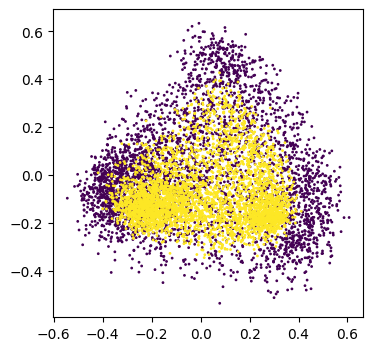

In [54]:
plt.figure(figsize=(4,4))
plt.scatter(pca_comb_features[:,0], pca_comb_features[:,1],c=pca_comb_features_batch, s=1)

In [55]:
alpha = 0.5
cpd_coor, homo_coor, aligned_image = cpd_align(ad_tar_coor, ad_src_coor, pca_comb_features, src_img, alpha)

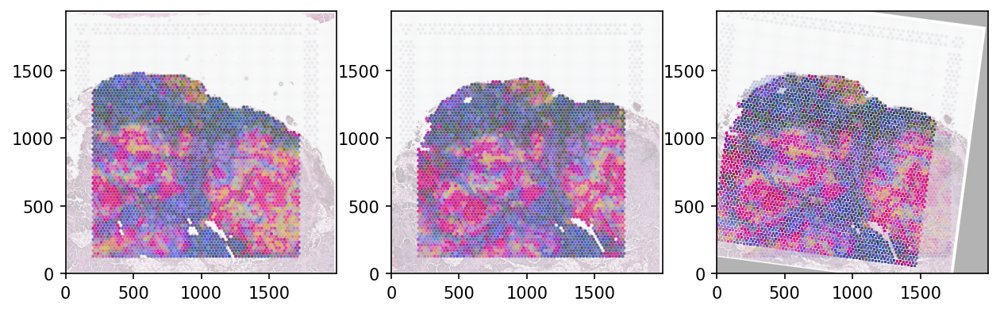

In [56]:
plot_alignment_with_img(ad_tar_coor, ad_src_coor, homo_coor, tar_img, src_img, aligned_image, pca_hex_comb, tar_features)

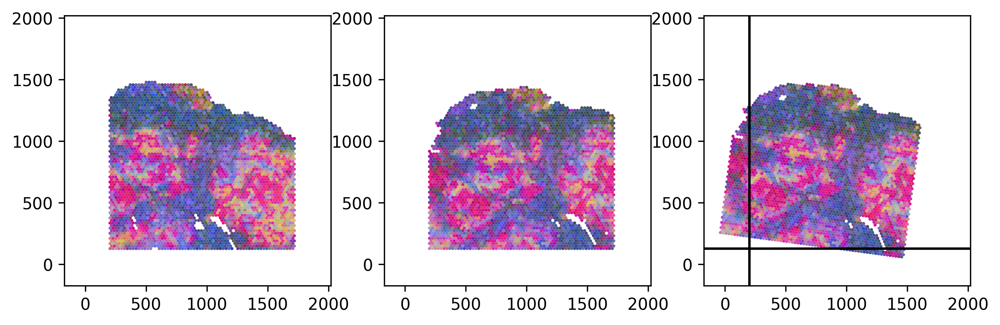

In [57]:
shift=300
s=0.8
plot_alignment(ad_tar_coor, ad_src_coor, homo_coor, pca_hex_comb, tar_features, shift=300, s=0.8)

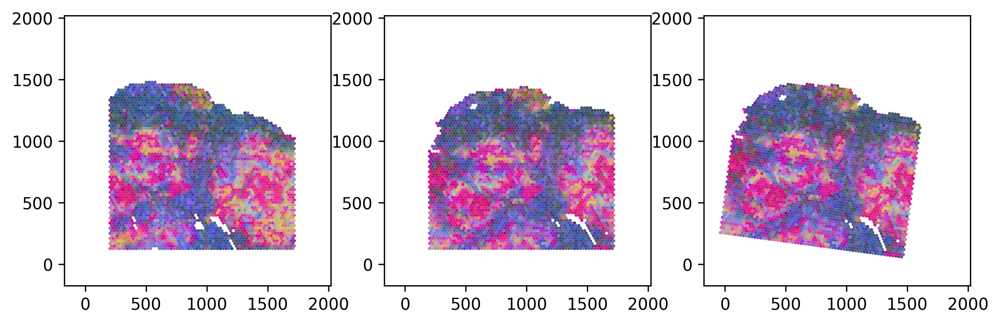

In [58]:
plot_alignment(ad_tar_coor, ad_src_coor, homo_coor, pca_hex_comb, tar_features, shift=300, s=0.8, boundary_line=False)

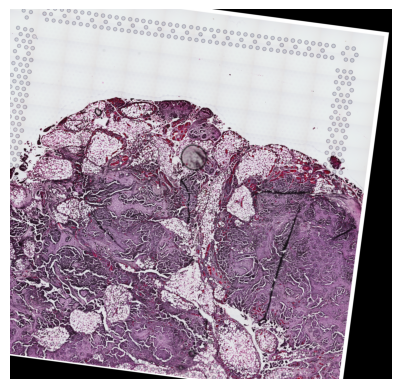

In [59]:
plt.imshow(aligned_image, origin='lower')
plt.axis('off')
plt.show()

In [60]:
save_name = 'omiclip_st_img_finetune10_alpha0.5.h5ad'
wirte_aligned_data(ad_src, aligned_image, homo_coor, save_name)

# Omiclip Results

In [61]:
def get_heg_of_hvg(ad):
    sc.pp.highly_variable_genes(ad)
    ad_hvg = ad[:, ad.var.highly_variable]
    ad_hvg.var['mean_expression'] = np.ravel(ad_hvg.X.mean(0))
    ad_heg_of_hvg = pd.DataFrame(ad_hvg.var.nlargest(200, 'mean_expression')['mean_expression'])

    return ad_heg_of_hvg

In [62]:
omiclip_ad_tar = ad_tar.copy()
omiclip_ad_tar.X.todense().sum(axis=1)

matrix([[1667.],
        [ 984.],
        [3124.],
        ...,
        [ 587.],
        [2997.],
        [2237.]], dtype=float32)

In [63]:
sc.pp.normalize_total(omiclip_ad_tar)
sc.pp.log1p(omiclip_ad_tar)
omiclip_ad_tar_heg_of_hvg = get_heg_of_hvg(omiclip_ad_tar)

/tmp/ipykernel_2591226/859710360.py:4: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.
  ad_hvg.var['mean_expression'] = np.ravel(ad_hvg.X.mean(0))


In [64]:
omiclip_ad_src_align_st = sc.read_h5ad(case_dir_omiclip+'omiclip_st_st_alpha0.5.h5ad')
omiclip_ad_src_align_img_zs = sc.read_h5ad(case_dir_omiclip+'omiclip_st_img_zeroshot_alpha0.5.h5ad')
omiclip_ad_src_align_img_ft = sc.read_h5ad(case_dir_omiclip+'omiclip_st_img_finetune10_alpha0.5.h5ad')

In [65]:
omiclip_ad_src_align_st.X.todense().sum(axis=1)

matrix([[2517.],
        [1443.],
        [3266.],
        ...,
        [ 772.],
        [1886.],
        [1498.]], dtype=float32)

In [66]:
sc.pp.normalize_total(omiclip_ad_src_align_st)
sc.pp.log1p(omiclip_ad_src_align_st)
omiclip_ad_src_heg_of_hvg = get_heg_of_hvg(omiclip_ad_src_align_st)

/tmp/ipykernel_2591226/859710360.py:4: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.
  ad_hvg.var['mean_expression'] = np.ravel(ad_hvg.X.mean(0))


In [67]:
omiclip_genes = [value for value in omiclip_ad_tar_heg_of_hvg.index.tolist() if value in omiclip_ad_src_heg_of_hvg.index.tolist()]
len(omiclip_genes)

112

In [68]:
omiclip_ad_tar_mean_expr = get_mean_expr_by_neighbor(omiclip_ad_tar)
omiclip_ad_tar_mean_expr.reset_index(inplace=True, drop=True)

100%|██████████| 3711/3711 [00:14<00:00, 255.17it/s]


In [69]:
omiclip_ad_src_align_mean_expr = get_mean_expr_by_neighbor(omiclip_ad_src_align_st)
omiclip_ad_src_align_mean_expr.reset_index(inplace=True, drop=True)

100%|██████████| 3668/3668 [00:14<00:00, 252.16it/s]


In [70]:
scalef_tar = get_scalefactors(omiclip_ad_tar)['tissue_hires_scalef']
scalef_src = get_scalefactors(omiclip_ad_src_align_st)['tissue_hires_scalef']

In [71]:
omiclip_matches_st = nearest_neighbour(omiclip_ad_src_align_st.obsm['spatial']*scalef_src, omiclip_ad_tar.obsm['spatial']*scalef_tar)
omiclip_matches_st.shape

Processing coordinates: 100%|██████████| 3668/3668 [00:54<00:00, 67.56it/s]


(3257, 2)

In [72]:
omiclip_matches_img_ft = nearest_neighbour(omiclip_ad_src_align_img_ft.obsm['spatial']*scalef_src, omiclip_ad_tar.obsm['spatial']*scalef_tar)
omiclip_matches_img_ft.shape

Processing coordinates: 100%|██████████| 3668/3668 [00:54<00:00, 67.50it/s]


(3285, 2)

In [73]:
omiclip_matches_img_zs = nearest_neighbour(omiclip_ad_src_align_img_zs.obsm['spatial']*scalef_src, omiclip_ad_tar.obsm['spatial']*scalef_tar)
omiclip_matches_img_zs.shape

Processing coordinates: 100%|██████████| 3668/3668 [00:54<00:00, 67.26it/s]


(3307, 2)

# Paste

In [74]:
paste_path = case_dir+'paste/'

## Align

In [75]:
import paste 
import matplotlib.patches as mpatches

Using selected backend cpu. If you want to use gpu, set use_gpu = True.


/condo/wanglab/hmaiwxc/anaconda3/envs/clip/lib/python3.9/site-packages/ot/lp/__init__.py:361: UserWarning: numItermax reached before optimality. Try to increase numItermax.
  result_code_string = check_result(result_code)


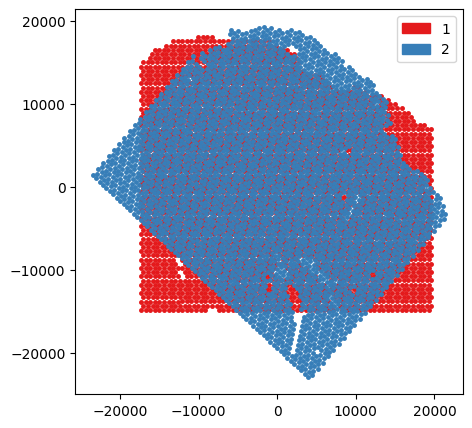

In [79]:
ad_tar_paste = sc.read_h5ad(os.path.join(data_dir, tar_sample_name+'.h5ad'))
sc.pp.filter_genes(ad_tar_paste, min_counts = 15)
sc.pp.filter_cells(ad_tar_paste, min_counts = 100)
del ad_tar_paste.uns

ad_src_paste = sc.read_h5ad(os.path.join(data_dir, src_sample_name+'.h5ad'))
sc.pp.filter_genes(ad_src_paste, min_counts = 15)
sc.pp.filter_cells(ad_src_paste, min_counts = 100)
del ad_src_paste.uns

pi12 = paste.pairwise_align(ad_tar_paste, ad_src_paste)

# To visualize the alignment you can stack the slices 
# according to the alignment pi
slices, pis = [ad_tar_paste, ad_src_paste], [pi12]
new_slices = paste.stack_slices_pairwise(slices, pis)


slice_colors = ['#e41a1c','#377eb8']
plt.figure(figsize=(5,5))
for i in range(len(new_slices)):
    paste.plot_slice(new_slices[i],slice_colors[i],s=50)
plt.legend(handles=[mpatches.Patch(color=slice_colors[0], label='1'),mpatches.Patch(color=slice_colors[1], label='2')])
# plt.gca().invert_yaxis()
# plt.axis('off')
# plt.savefig(save_path+'paste_aligment.pdf')
plt.show()

In [80]:
new_slices[0].write_h5ad(paste_path+'paste_aligment_target.h5ad')
new_slices[1].write_h5ad(paste_path+'paste_aligment_source.h5ad')

## Results

In [81]:
paste_tar_ad = sc.read_h5ad(paste_path+'paste_aligment_target.h5ad')
paste_align_ad = sc.read_h5ad(paste_path+'paste_aligment_source.h5ad')

In [82]:
paste_tar_ad.X.todense().sum(axis=1)

matrix([[1659.],
        [ 977.],
        [3106.],
        ...,
        [ 581.],
        [2985.],
        [2225.]], dtype=float32)

In [83]:
sc.pp.normalize_total(paste_tar_ad)
sc.pp.normalize_total(paste_align_ad)
sc.pp.log1p(paste_tar_ad)
sc.pp.log1p(paste_align_ad)

In [84]:
ad_src = sc.read_h5ad(os.path.join(data_dir, src_sample_name+'.h5ad'))
paste_shared_index = find_matching_indices(ad_src.obs.index.to_list(), paste_align_ad.obs.index.to_list())

In [85]:
paste_tar_coor = (paste_tar_ad.obsm['spatial']-paste_tar_ad.obsm['spatial'].min())/(paste_tar_ad.obsm['spatial'].max()-paste_tar_ad.obsm['spatial'].min())*(ad_tar_coor.max()-ad_tar_coor.min())
paste_align_coor = (paste_align_ad.obsm['spatial']-paste_tar_ad.obsm['spatial'].min())/(paste_tar_ad.obsm['spatial'].max()-paste_tar_ad.obsm['spatial'].min())*(ad_tar_coor.max()-ad_tar_coor.min())

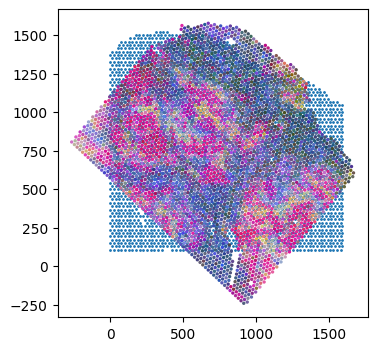

In [86]:
plt.figure(figsize=(4,4))
plt.scatter(paste_tar_coor[:,0], paste_tar_coor[:,1], s=1)
plt.scatter(paste_align_coor[:,0], paste_align_coor[:,1], s=2, c=[pca_hex_comb[len(tar_features.T):][i] for i in paste_shared_index[:,0]])

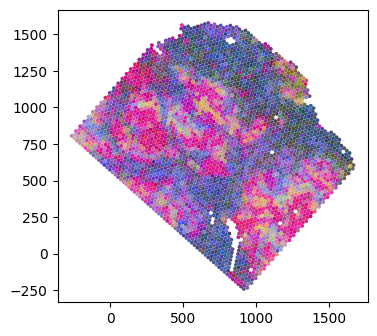

In [87]:
plt.figure(figsize=(4,3.8))
plt.scatter(paste_align_coor[:,0], paste_align_coor[:,1], s=3, c=[pca_hex_comb[len(tar_features.T):][i] for i in paste_shared_index[:,0]])

In [88]:
paste_matches = nearest_neighbour(paste_align_coor, paste_tar_coor)
paste_matches.shape

Processing coordinates: 100%|██████████| 3663/3663 [00:54<00:00, 66.76it/s]


(3139, 2)

In [89]:
paste_ad_tar_mean_expr = get_mean_expr_by_neighbor(paste_tar_ad)
paste_ad_tar_mean_expr.reset_index(inplace=True,drop=True)

100%|██████████| 3701/3701 [00:12<00:00, 299.31it/s]


In [90]:
paste_ad_src_align_mean_expr = get_mean_expr_by_neighbor(paste_align_ad)
paste_ad_src_align_mean_expr.reset_index(inplace=True,drop=True)

100%|██████████| 3663/3663 [00:11<00:00, 306.17it/s]


# GPSA

In [91]:
gpsa_tar_ad = sc.read_h5ad(case_dir+'gpsa/gpsa_target.h5ad')
gpsa_align_ad = sc.read_h5ad(case_dir+'gpsa/gpsa_alignment.h5ad')

In [92]:
gpsa_align_ad.X.todense().sum(axis=1)

matrix([[430.77924],
        [401.61725],
        [330.72586],
        ...,
        [306.4498 ],
        [433.41153],
        [361.78387]], dtype=float32)

In [93]:
gpsa_align = pd.read_csv(case_dir+'gpsa/gpsa_align_coor.csv', index_col=0)
gpsa_align = np.array(gpsa_align)
gpsa_tar = pd.read_csv(case_dir+'gpsa/gpsa_tar_coor.csv', index_col=0)
gpsa_tar = np.array(gpsa_tar)

In [94]:
ad_src = sc.read_h5ad(os.path.join(data_dir, src_sample_name+'.h5ad'))
gpsa_shared_index = find_matching_indices(ad_src.obs.index.to_list(), gpsa_align_ad.obs.index.to_list())

In [98]:
gpsa_align_resize = (gpsa_align/10)*(ad_tar_coor.max(axis=0)-ad_tar_coor.min(axis=0))+ad_tar_coor.min(axis=0)
gpsa_tar_resize = (gpsa_tar/10)*(ad_tar_coor.max(axis=0)-ad_tar_coor.min(axis=0))+ad_tar_coor.min(axis=0)

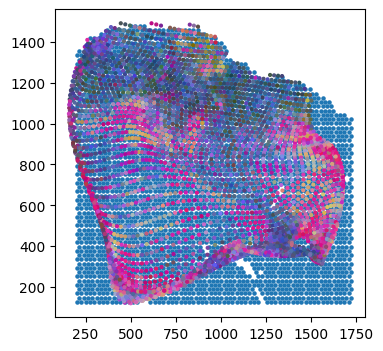

In [100]:
plt.figure(figsize=(4, 4))
plt.scatter(gpsa_tar_resize[:,0], gpsa_tar_resize[:,1], s=5)
plt.scatter(gpsa_align_resize[:,0], gpsa_align_resize[:,1], c = [pca_hex_comb[len(tar_features.T):][i] for i in gpsa_shared_index[:,0]],s=4)

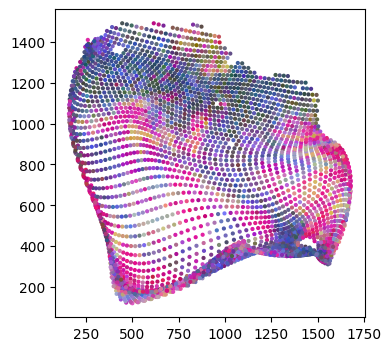

In [102]:
plt.figure(figsize=(4, 4))
plt.scatter(gpsa_align_resize[:,0], gpsa_align_resize[:,1], c = [pca_hex_comb[len(tar_features.T):][i] for i in gpsa_shared_index[:,0]],s=4)

In [103]:
gpsa_align_ad.obs[['newy', 'newx']] = gpsa_align_resize
gpsa_tar_ad.obs[['newy', 'newx']] = gpsa_tar_resize

In [104]:
gpsa_matches = nearest_neighbour(gpsa_align_resize, gpsa_tar_resize)
gpsa_matches.shape

Processing coordinates: 100%|██████████| 3663/3663 [01:03<00:00, 57.39it/s]


(3559, 2)

In [105]:
gpsa_ad_tar_mean_expr = get_mean_expr_by_dist(gpsa_tar_ad)
gpsa_ad_tar_mean_expr.reset_index(inplace=True, drop=True)

100%|██████████| 3701/3701 [00:06<00:00, 531.86it/s]


In [106]:
gpsa_ad_src_align_mean_expr = get_mean_expr_by_dist(gpsa_align_ad)
gpsa_ad_src_align_mean_expr.reset_index(inplace=True, drop=True)

100%|██████████| 3663/3663 [00:06<00:00, 560.04it/s]


In [107]:
shared_genes = [value for value in omiclip_genes if value in gpsa_ad_tar_mean_expr.columns.tolist()]
shared_genes = [value for value in shared_genes if value in gpsa_ad_src_align_mean_expr.columns.tolist()]
len(shared_genes)

106

# Combine Analysis

## MSE

In [110]:
def calculate_mse(mse_df, genes, tar_mean_expr, src_align_mean_expr, matches):
    for gene in tqdm(genes):
        mse = mean_squared_error(tar_mean_expr.loc[matches[:,1], gene], src_align_mean_expr.loc[matches[:,0], gene])
        mse_df.loc[gene, 'mse'] = mse
    return mse_df

In [113]:
omiclip_mse_st = pd.DataFrame()
omiclip_mse_st = calculate_mse(omiclip_mse_st, shared_genes, omiclip_ad_tar_mean_expr, omiclip_ad_src_align_mean_expr, omiclip_matches_st)
omiclip_mse_img_ft = pd.DataFrame()
omiclip_mse_img_ft = calculate_mse(omiclip_mse_img_ft, shared_genes, omiclip_ad_tar_mean_expr, omiclip_ad_src_align_mean_expr, omiclip_matches_img_ft)
omiclip_mse_img_zs = pd.DataFrame()
omiclip_mse_img_zs = calculate_mse(omiclip_mse_img_zs, shared_genes, omiclip_ad_tar_mean_expr, omiclip_ad_src_align_mean_expr, omiclip_matches_img_zs)
paste_mse = pd.DataFrame()
paste_mse = calculate_mse(paste_mse, shared_genes, paste_ad_tar_mean_expr, paste_ad_src_align_mean_expr, paste_matches)
gpsa_mse = pd.DataFrame()
gpsa_mse = calculate_mse(gpsa_mse, shared_genes, gpsa_ad_tar_mean_expr, gpsa_ad_src_align_mean_expr, gpsa_matches)

100%|██████████| 106/106 [00:00<00:00, 597.80it/s]


In [114]:
all_mse = pd.concat([omiclip_mse_st['mse'], 
                     omiclip_mse_img_ft['mse'], 
                     omiclip_mse_img_zs['mse'], 
                     gpsa_mse['mse'], 
                     paste_mse['mse'], 
                    ],axis=1)
all_mse.columns = ['omiclip_st','omiclip_img_ft','omiclip_img_zs','gpsa','paste',]
# all_mse

(0.0, 0.6)

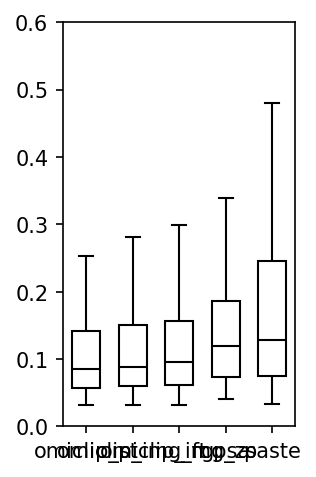

In [115]:
plt.figure(figsize=(2,3.5),dpi=150)
sns.boxplot(all_mse, showfliers=False,
                       width=0.6,
                linecolor = 'black',
                linewidth=1., 
           color='white')
plt.ylim((0,0.6))

In [116]:
ranksums(paste_mse['mse'], omiclip_mse_img_zs['mse'], alternative='greater')

RanksumsResult(statistic=2.962475724132958, pvalue=0.001525879364528116)

In [117]:
ranksums(gpsa_mse['mse'], omiclip_mse_img_zs['mse'], alternative='greater')

RanksumsResult(statistic=2.3399751562501447, pvalue=0.009642511344544883)

In [118]:
ranksums(omiclip_mse_img_zs['mse'], omiclip_mse_st['mse'], alternative='greater')

RanksumsResult(statistic=1.0591466496711182, pvalue=0.14476649874429226)

## Plot gene heatmap

In [119]:
len(shared_genes)

106

In [145]:
cmap = 'RdYlGn'

In [120]:
sc.pp.normalize_total(omiclip_ad_src_align_img_ft)
sc.pp.log1p(omiclip_ad_src_align_img_ft)

In [1]:
# for gene in shared_genes:
#     print(gene)
#     plt.figure(figsize=(16, 3.5))
#     plt.subplot(1, 4, 1)
#     plt.scatter(omiclip_ad_tar.obsm['spatial'][:,0], omiclip_ad_tar.obsm['spatial'][:,1], s=3, c=np.array(omiclip_ad_tar[:,gene].X.todense().T[0]), cmap=cmap)
    
#     plt.subplot(1, 4, 2)
#     plt.scatter(omiclip_ad_src_align_img_ft.obsm['spatial'][:,0], omiclip_ad_src_align_img_ft.obsm['spatial'][:,1], s=3, c=np.array(omiclip_ad_src_align_img_ft[:,gene].X.todense().T[0]), cmap=cmap)
    
#     plt.subplot(1, 4, 3)
#     plt.scatter(gpsa_align_resize[:,0], gpsa_align_resize[:,1], s=1, c=np.array(gpsa_align_ad[:,gene].X.todense().T[0]), cmap=cmap)
    
#     plt.subplot(1, 4, 4)
#     plt.scatter(paste_align_coor[:,0], paste_align_coor[:,1], s=1, c=np.array(paste_align_ad[:,gene].X.todense().T[0]), cmap=cmap)
    
#     plt.show()

In [123]:
# gene = 'COL1A1'
# gene = 'IGHG1'
# gene = 'FN1'
# gene = 'SFRP2'
gene = 'FABP4'

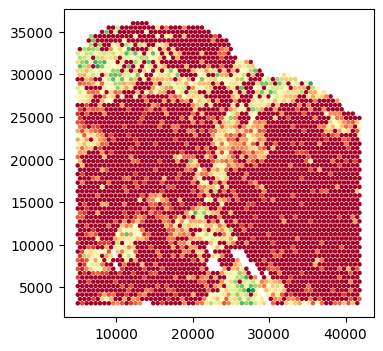

In [146]:
plt.figure(figsize=(4, 4))
plt.scatter(omiclip_ad_tar.obsm['spatial'][:,0], omiclip_ad_tar.obsm['spatial'][:,1], s=5, c=np.array(omiclip_ad_tar[:,gene].X.todense().T[0]), cmap=cmap)

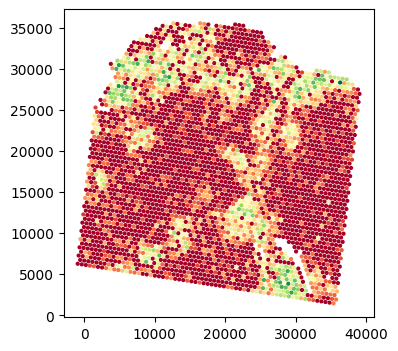

In [147]:
plt.figure(figsize=(4, 4))
plt.scatter(omiclip_ad_src_align_img_ft.obsm['spatial'][:,0], omiclip_ad_src_align_img_ft.obsm['spatial'][:,1], s=4, c=np.array(omiclip_ad_src_align_img_ft[:,gene].X.todense().T[0]), cmap=cmap)

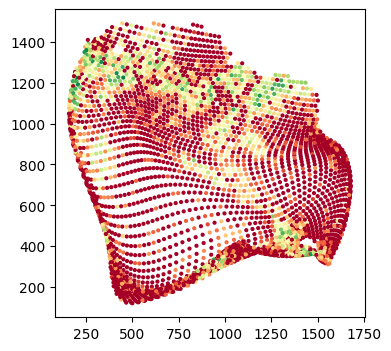

In [148]:
plt.figure(figsize=(4, 4))
plt.scatter(gpsa_align_resize[:,0], gpsa_align_resize[:,1], s=4, c=np.array(gpsa_align_ad[:,gene].X.todense().T[0]), cmap=cmap)

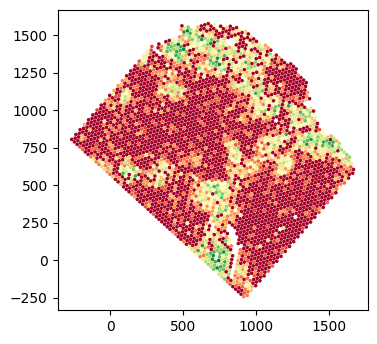

In [149]:
plt.figure(figsize=(4, 3.9))
plt.scatter(paste_align_coor[:,0], paste_align_coor[:,1], s=2.5, c=np.array(paste_align_ad[:,gene].X.todense().T[0]), cmap=cmap)

In [ ]:
fig, ((ax1,ax2,ax3,ax4)) = plt.subplots(1,4, figsize=(15,3))
axlist = [ax1,ax2,ax3,ax4]

im1 = ax1.scatter(omiclip_ad_tar.obsm['spatial'][:,0], omiclip_ad_tar.obsm['spatial'][:,1], s=5, c=np.array(omiclip_ad_tar[:,gene].X.todense().T[0]), cmap=cmap)
ax2.scatter(omiclip_ad_src_align_img_ft.obsm['spatial'][:,0], omiclip_ad_src_align_img_ft.obsm['spatial'][:,1], s=4, c=np.array(omiclip_ad_src_align_img_ft[:,gene].X.todense().T[0]), cmap=cmap)
ax3.scatter(gpsa_align_resize[:,0], gpsa_align_resize[:,1], s=1, c=np.array(gpsa_align_ad[:,gene].X.todense().T[0]),cmap=cmap)
ax4.scatter(paste_align_coor[:,0], paste_align_coor[:,1], s=2.5, c=np.array(paste_align_ad[:,gene].X.todense().T[0]), cmap=cmap)

fig.colorbar(im1, ax=axlist)
plt.show()

## PSR

In [324]:
def calculate_psr(psr_df, genes, tar_mean_expr, src_align_mean_expr, matches):
    psr_df = pd.DataFrame()
    for gene in tqdm(genes):
        psr = stats.pearsonr(tar_mean_expr.loc[matches[:,1], gene], src_align_mean_expr.loc[matches[:,0], gene])[0]
        psr_df.loc[gene, 'psr'] = psr
    return psr_df

In [325]:
omiclip_psr_st = calculate_psr(omiclip_psr_st, shared_genes_he_gpsa, ad_tar_mean_expr, ad_src_align_mean_expr, omiclip_matches_st)
omiclip_psr_img_ft = calculate_psr(omiclip_psr_img_ft, shared_genes_he_gpsa, ad_tar_mean_expr, ad_src_align_mean_expr, omiclip_matches_img_ft)
omiclip_psr_img_zs = calculate_psr(omiclip_psr_img_zs, shared_genes_he_gpsa, ad_tar_mean_expr, ad_src_align_mean_expr, omiclip_matches_img_zs)
paste_psr = calculate_psr(paste_psr, shared_genes_he_gpsa, paste_ad_tar_mean_expr, paste_ad_src_align_mean_expr, paste_matches)
gpsa_psr = calculate_psr(gpsa_psr, shared_genes_he_gpsa, gpsa_ad_tar_mean_expr, gpsa_ad_src_align_mean_expr, gpsa_matches)

100%|██████████| 106/106 [00:00<00:00, 498.52it/s]


In [332]:
all_psr = pd.concat([omiclip_psr_st['psr'], omiclip_psr_img_ft['psr'], omiclip_psr_img_zs['psr'], 
                     gpsa_psr['psr'], paste_psr['psr']],axis=1)
all_psr.columns = ['omiclip_st','omiclip_img_ft', 'omiclip_img_zs','gpsa','paste']
# all_psr

<Axes: >

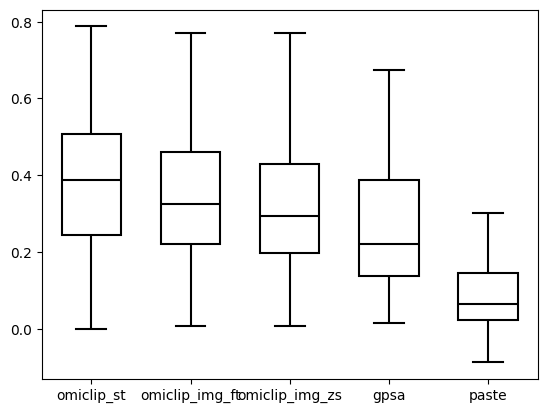

In [333]:
sns.boxplot(all_psr, showfliers=False,                                
            width=0.6,
                linecolor = 'black',
                linewidth=1.5, 
           color='white')

## Draft

In [306]:
ad_src_align_img_zs.X.todense().sum(axis=1)

matrix([[1112.6165 ],
        [1005.29144],
        [1225.1711 ],
        ...,
        [ 836.7591 ],
        [1069.6276 ],
        [1027.911  ]], dtype=float32)

In [299]:
omiclip_mse_st = pd.DataFrame()
for gene in tqdm(shared_genes_he):
    mse = mean_squared_error(np.array(omiclip_ad_tar[omiclip_matches_st[:,1], gene].X.todense().T)[0], np.array(ad_src_align_st[omiclip_matches_st[:,0], gene].X.todense().T)[0])
    omiclip_mse_st.loc[gene, 'mse'] = mse

100%|██████████| 112/112 [00:03<00:00, 34.99it/s]


In [300]:
omiclip_mse_img_ft = pd.DataFrame()
for gene in tqdm(shared_genes_he):
    mse = mean_squared_error(np.array(omiclip_ad_tar[omiclip_matches_img_ft[:,1], gene].X.todense().T)[0], np.array(ad_src_align_img_ft[omiclip_matches_img_ft[:,0], gene].X.todense().T)[0])
    omiclip_mse_img_ft.loc[gene, 'mse'] = mse

100%|██████████| 112/112 [00:03<00:00, 34.08it/s]


In [301]:
omiclip_mse_img_zs = pd.DataFrame()
for gene in tqdm(shared_genes_he):
    mse = mean_squared_error(np.array(omiclip_ad_tar[omiclip_matches_img_zs[:,1], gene].X.todense().T)[0], np.array(ad_src_align_img_zs[omiclip_matches_img_zs[:,0], gene].X.todense().T)[0])
    omiclip_mse_img_zs.loc[gene, 'mse'] = mse

100%|██████████| 112/112 [00:03<00:00, 34.48it/s]


In [289]:
paste_mse = pd.DataFrame()
for gene in tqdm(shared_genes_he):
    mse = mean_squared_error(np.array(new_slices[0][paste_matches[:,1], gene].X.todense().T)[0], np.array(new_slices[1][paste_matches[:,0], gene].X.todense().T)[0])
    paste_mse.loc[gene, 'mse'] = mse

100%|██████████| 112/112 [00:02<00:00, 38.35it/s]


In [290]:
gpsa_mse = pd.DataFrame()
for gene in tqdm(shared_genes_he_gpsa):
    mse = mean_squared_error(np.array(gpsa_tar_ad[gpsa_matches[:,1], gene].X.todense().T)[0], np.array(gpsa_align_ad[gpsa_matches[:,0], gene].X.todense().T)[0])
    gpsa_mse.loc[gene, 'mse'] = mse

100%|██████████| 106/106 [00:01<00:00, 74.20it/s]


In [302]:
all_mse = pd.concat([omiclip_mse_st.loc[shared_genes_he_gpsa,'mse'],
                     omiclip_mse_img_ft.loc[shared_genes_he_gpsa,'mse'], 
                    omiclip_mse_img_zs.loc[shared_genes_he_gpsa,'mse'], 
                    gpsa_mse['mse'], 
                     paste_mse.loc[shared_genes_he_gpsa,'mse'],
                    ],axis=1)
all_mse.columns = ['omiclip_st','omiclip_img_ft','omiclip_img_zs','gpsa','paste',]
all_mse

,omiclip_st,omiclip_img_ft,omiclip_img_zs,gpsa,paste
COL1A1,0.931628,1.002840,0.990247,1.087981,1.198119
MT-CYB,0.423433,0.424020,0.432458,0.407107,0.439538
COL1A2,0.855612,0.884748,0.900352,0.943614,0.994164
COL3A1,0.929507,0.977743,0.994024,1.006680,1.103068
CD74,0.576098,0.601879,0.619985,0.636326,0.685067
...,...,...,...,...,...
SOCS3,0.244949,0.242408,0.244803,0.245661,0.249543
YBX3,0.218605,0.219726,0.224854,0.218379,0.220540
IER2,0.247028,0.246207,0.246497,0.229888,0.249995
PRDX3,0.230744,0.224131,0.221417,0.207518,0.221634


<Axes: >

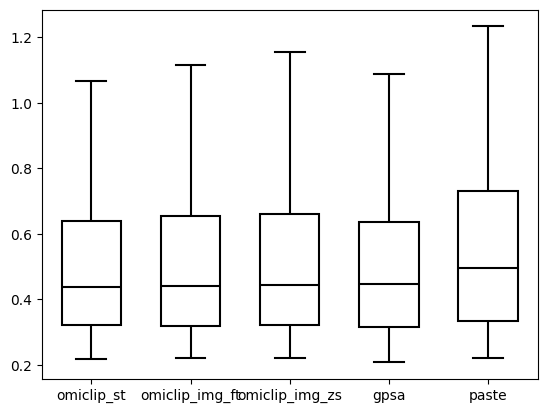

In [303]:
sns.boxplot(all_mse, showfliers=False,
                       width=0.6,
                linecolor = 'black',
                linewidth=1.5, 
           color='white')

In [293]:
wilcoxon(paste_mse.loc[shared_genes_he_gpsa,'mse'], omiclip_mse_img_zs.loc[shared_genes_he_gpsa,'mse'], alternative='greater')

WilcoxonResult(statistic=0.0, pvalue=1.0)

In [294]:
wilcoxon(gpsa_mse.loc[shared_genes_he_gpsa,'mse'], omiclip_mse_img_zs.loc[shared_genes_he_gpsa,'mse'], alternative='greater')

WilcoxonResult(statistic=0.0, pvalue=1.0)

In [295]:
wilcoxon(omiclip_mse_img_zs.loc[shared_genes_he_gpsa,'mse'], omiclip_mse_st.loc[shared_genes_he_gpsa,'mse'], alternative='greater')

WilcoxonResult(statistic=3696.0, pvalue=0.003341902473848393)

In [296]:
ranksums(paste_mse.loc[shared_genes_he_gpsa,'mse'], omiclip_mse_img_zs.loc[shared_genes_he_gpsa,'mse'], alternative='greater')

RanksumsResult(statistic=-7.0915802103772325, pvalue=0.9999999999993371)

In [297]:
ranksums(gpsa_mse.loc[shared_genes_he_gpsa,'mse'], omiclip_mse_img_zs.loc[shared_genes_he_gpsa,'mse'], alternative='greater')

RanksumsResult(statistic=-8.023091851525615, pvalue=0.9999999999999994)

In [298]:
ranksums(omiclip_mse_img_zs.loc[shared_genes_he_gpsa,'mse'], omiclip_mse_st.loc[shared_genes_he_gpsa,'mse'], alternative='greater')

RanksumsResult(statistic=0.05598026689593647, pvalue=0.4776787636210748)